In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.distributions import Normal, MultivariateNormal
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from torch.utils.data.dataset import random_split
from torch.optim import Adam
from torch.nn import NLLLoss, CrossEntropyLoss
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import plotly.offline as py
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff

from pathlib import Path
import pickle

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [3]:
def show_images(images):
    images = torchvision.utils.make_grid(images, nrow=5)
    plt.imshow(images.permute(1, 2, 0), cmap="gray")
    plt.show()

In [4]:
class Flatten(nn.Module):
    def __init__(self, c, h, w):
        super().__init__()
        self.c = c
        self.h = h
        self.w = w
    
    def forward(self, x):
        return x.view(-1, self.c * self.h * self.w)


class Unflatten(nn.Module):
    def __init__(self, c, h, w):
        super().__init__()
        self.c = c
        self.h = h
        self.w = w
    
    def forward(self, x):
        return x.view(-1, self.c, self.h, self.w)


class Encoder(nn.Module):
    def __init__(self, image_channels: int):
        super().__init__()

        self.encoder1 = nn.Sequential(
            nn.Conv2d(image_channels, 32, kernel_size=5, stride=1, padding=2),
            nn.LeakyReLU(),
            nn.Conv2d(32, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32)
        )
        self.encoder2 = nn.Sequential(
            nn.LeakyReLU(),
            nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2),
            nn.LeakyReLU(),
            nn.Conv2d(64, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64)
        )
        self.encoder3 = nn.Sequential(
            nn.LeakyReLU(),
            nn.Conv2d(64, 128, kernel_size=5, stride=1, padding=2),
            nn.LeakyReLU(),
            nn.Conv2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128)
        )
        self.encoder4 = nn.Sequential(
            nn.LeakyReLU(),
            nn.Conv2d(128, 256, kernel_size=5, stride=1, padding=2),
            nn.LeakyReLU(),
            nn.Conv2d(256, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256)
        )
        self.flatten = Flatten(256, 8, 8)

    def forward(self, x):
        z = self.encoder1(x)
        z = self.encoder2(z)
        z = self.encoder3(z)
        z = self.encoder4(z)
        z = self.flatten(z)

        n, d = z.shape
        mu, logvar = torch.split(z, split_size_or_sections=d//2, dim=1)
        return mu, logvar


class Decoder(nn.Module):
    def __init__(self, image_channels: int):
        super().__init__()

        self.decoder1 = nn.Sequential(
            Unflatten(128, 8, 8),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256)
        )
        self.decoder2 = nn.Sequential(
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=5, stride=1, padding=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128)
        )
        self.decoder3 = nn.Sequential(
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=1, padding=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64)
        )
        self.decoder4 = nn.Sequential(
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=5, stride=1, padding=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32)
        )
        self.decoder5 = nn.Sequential(
            nn.ReLU(),
            nn.ConvTranspose2d(32, image_channels, kernel_size=5, stride=1, padding=2),
            nn.Sigmoid(),
        )

    def forward(self, z):
        y = self.decoder1(z)
        y = self.decoder2(y)
        y = self.decoder3(y)
        y = self.decoder4(y)
        y = self.decoder5(y)
        return y


class ConvolutionalVAE(nn.Module):
    def __init__(self, channels=3, device=torch.device('cpu')):
        super().__init__()

        self.device = device
        self.hidden_size = 128 * 8 * 8

        self.encoder = Encoder(image_channels=channels)
        self.decoder = Decoder(image_channels=channels)

    def forward(self, x):
        n, c, h, w = x.shape
        
        mu_z, logvar_z = self.encoder(x)
        z = mu_z + torch.exp(0.5 * logvar_z) * torch.randn_like(mu_z).to(self.device)
        y = self.decoder(z)

        return y.clamp(0, 1), mu_z, logvar_z

    def generate(self, n):
        z = torch.randn(n, self.hidden_size).to(self.device)
        y = self.decoder(z)
        return y.clamp(0, 1)
    

def vae_mse_loss(x, y, mu_z, logvar_z):
    kldiv_loss = 0.5 * (logvar_z.exp() + mu_z**2 - 1 - logvar_z).sum()
    mse_loss = F.mse_loss(y, x, reduction='sum')
    return kldiv_loss, mse_loss

In [5]:
dataset_path = Path('dataset', 'images.pt')
dataset = torch.load(str(dataset_path))

In [6]:
train_images = dataset.float() / 255
# TODO targets
train_dataset = TensorDataset(train_images)
train_sampler = RandomSampler(train_dataset)
train_loader = DataLoader(train_dataset, batch_size=256, sampler=train_sampler)

In [7]:
def make_loss_figure():
    traces = [
        go.Scatter(x=[], y=[], mode='lines', name='train ELBO loss'),
        go.Scatter(x=[], y=[], mode='lines', name='train KL-div loss'),
        go.Scatter(x=[], y=[], mode='lines', name='train decoder loss'),
    ]
    figure = go.FigureWidget(data=traces)
    figure.update_layout(title='Losses')
    return figure


def fit_model(model, optimizer, loss_fn, train_loader, valid_loader, valid_images, epochs, device):
    figure = make_loss_figure()

    for epoch in tqdm(range(epochs)):
        print('epoch={},\t '.format(epoch), end='')

        model.train()
        kldiv_loss_avg, decoder_loss_avg, total_loss_avg = 0, 0, 0
        for batch in train_loader:
            x = batch[0].to(device)
            model_out = model(x)
            kldiv_loss, decoder_loss = loss_fn(x, *model_out)
            total_loss = 1 * kldiv_loss + decoder_loss

            optimizer.zero_grad()
            total_loss.backward()
            optimizer.step()

            kldiv_loss_avg += kldiv_loss.item()
            decoder_loss_avg += decoder_loss.item()
            total_loss_avg += total_loss.item()
            
        for i, loss in enumerate([total_loss_avg, kldiv_loss_avg, decoder_loss_avg]):
            figure.data[i].x += tuple([epoch])
            figure.data[i].y += tuple([loss / len(train_loader)])

        print('train kldiv loss={},\t train decoder loss={}'.format(kldiv_loss_avg / len(train_loader), decoder_loss_avg / len(train_loader)))

        with torch.no_grad():
            model_out = model(valid_images.to(device))
            y = model_out[0].cpu().detach()
            show_images(y)
            y = model.generate(25).cpu().detach()
            show_images(y)
    figure.show()

epoch=0,	 train kldiv loss=975529.706638756,	 train decoder loss=455490.14159688994


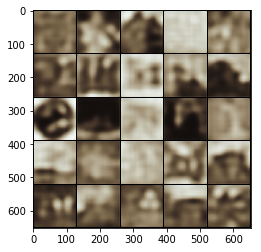

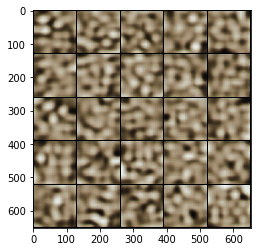

epoch=1,	 train kldiv loss=636551.8901016746,	 train decoder loss=317214.42366925837


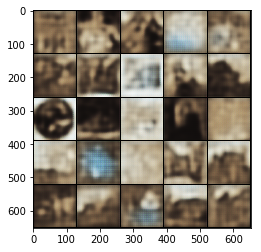

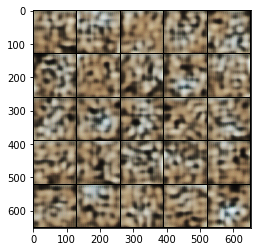

epoch=2,	 train kldiv loss=371096.0930023923,	 train decoder loss=258169.56777063396


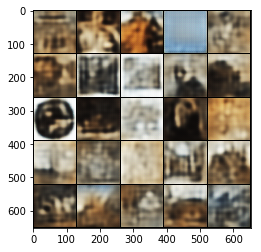

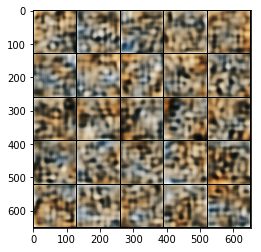

epoch=3,	 train kldiv loss=217857.98990729664,	 train decoder loss=243792.49099132774


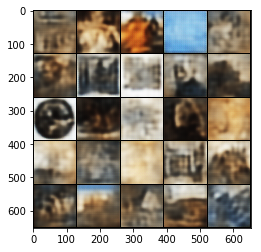

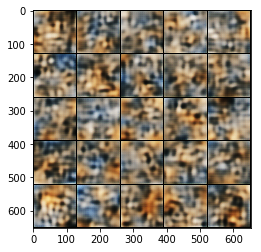

epoch=4,	 train kldiv loss=129515.77975478469,	 train decoder loss=247569.21740430623


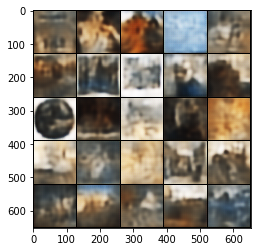

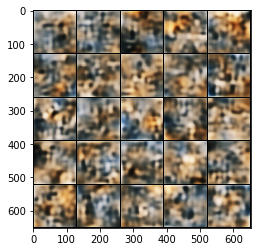

epoch=5,	 train kldiv loss=88213.26747532895,	 train decoder loss=256810.92329545456


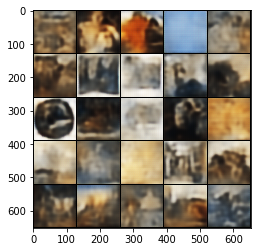

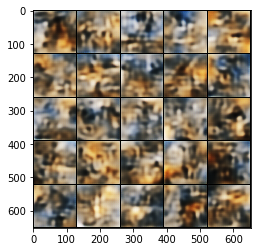

epoch=6,	 train kldiv loss=87738.48332834928,	 train decoder loss=273417.0370813397


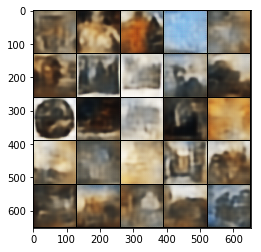

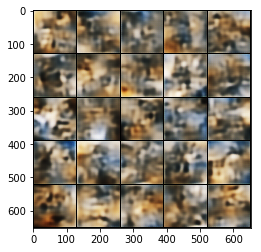

epoch=7,	 train kldiv loss=63422.06259345096,	 train decoder loss=264585.49125299044


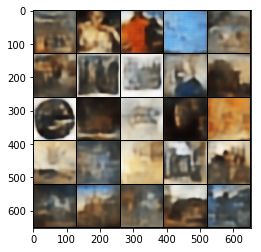

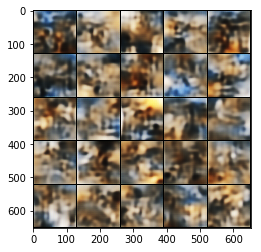

epoch=8,	 train kldiv loss=56335.220712470094,	 train decoder loss=260702.17651016745


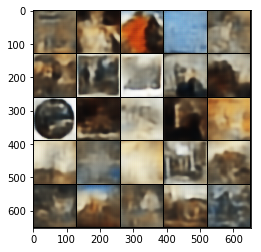

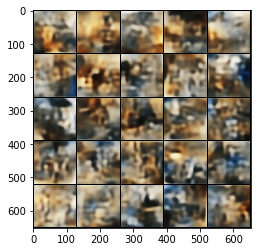

epoch=9,	 train kldiv loss=53584.16302519438,	 train decoder loss=258869.1894437799


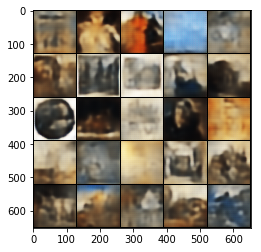

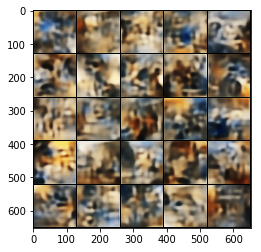

epoch=10,	 train kldiv loss=52265.40787604665,	 train decoder loss=256114.6875


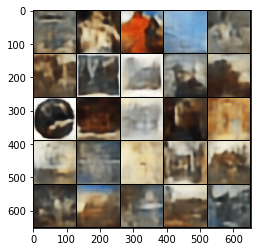

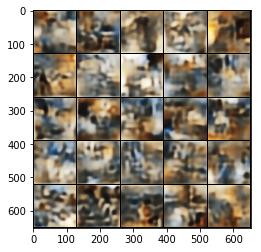

epoch=11,	 train kldiv loss=51757.4761232805,	 train decoder loss=254417.5453797847


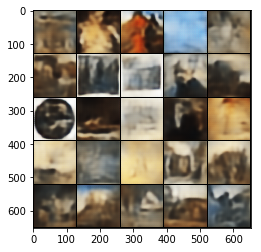

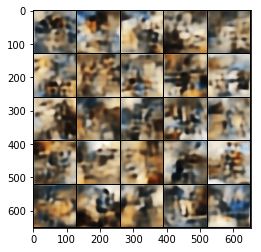

epoch=12,	 train kldiv loss=51536.646540445574,	 train decoder loss=251993.07786333733


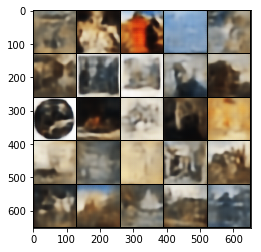

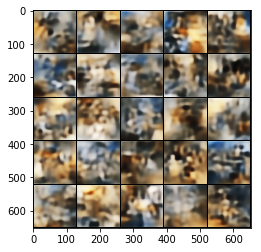

epoch=13,	 train kldiv loss=51360.760391746415,	 train decoder loss=251022.71538576554


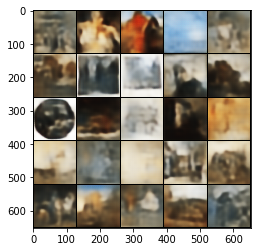

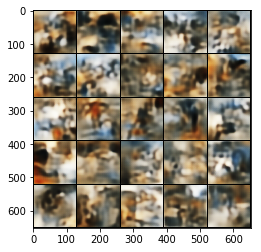

epoch=14,	 train kldiv loss=51212.07287305622,	 train decoder loss=249001.05790221292


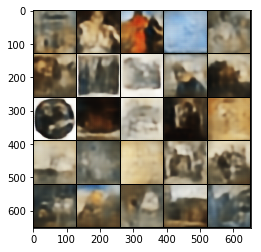

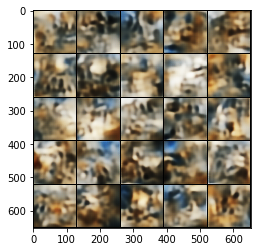

epoch=15,	 train kldiv loss=51159.799099132775,	 train decoder loss=247296.38187799044


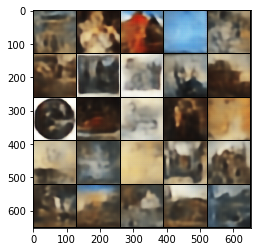

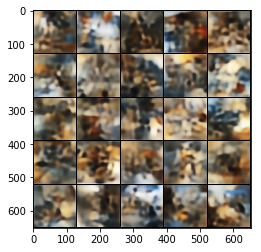

epoch=16,	 train kldiv loss=51234.296632027515,	 train decoder loss=246549.76857805025


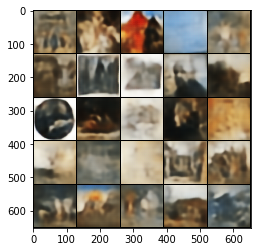

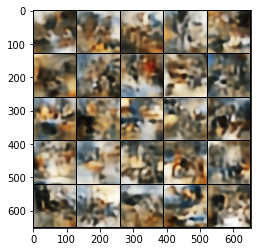

epoch=17,	 train kldiv loss=51332.62548594498,	 train decoder loss=245364.4043062201


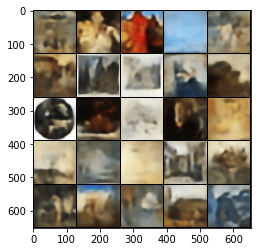

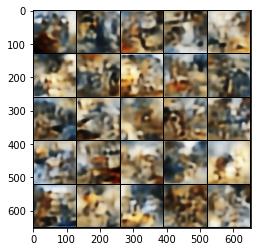

epoch=18,	 train kldiv loss=51417.0453610945,	 train decoder loss=241016.06739683016


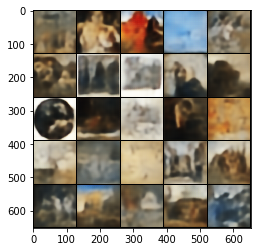

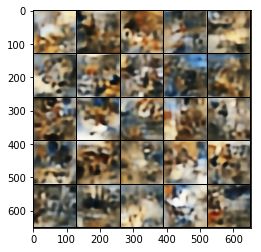

epoch=19,	 train kldiv loss=51320.21638569079,	 train decoder loss=238023.51532595695


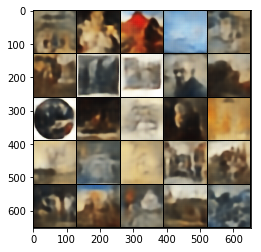

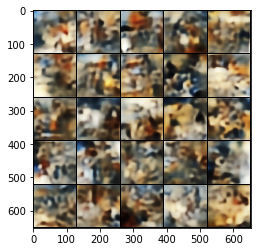

epoch=20,	 train kldiv loss=50789.642353842704,	 train decoder loss=234128.88860645934


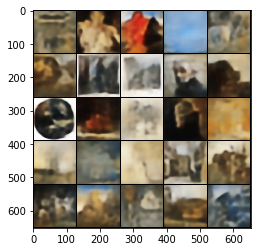

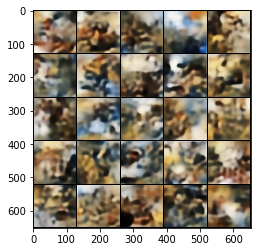

epoch=21,	 train kldiv loss=50675.33063883074,	 train decoder loss=229398.36034688994


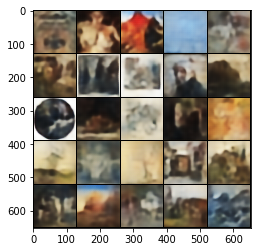

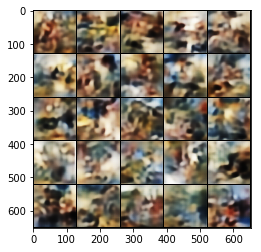

epoch=22,	 train kldiv loss=50916.3858496561,	 train decoder loss=223199.74820574163


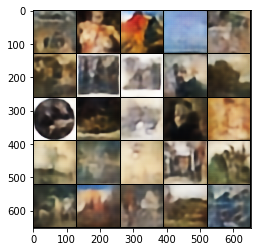

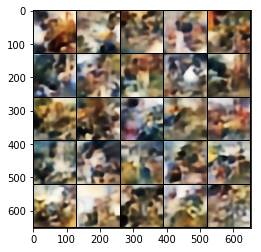

epoch=23,	 train kldiv loss=51121.624757027515,	 train decoder loss=217920.0798444976


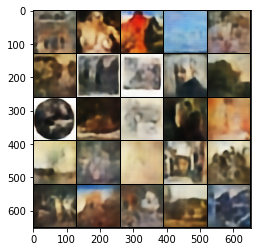

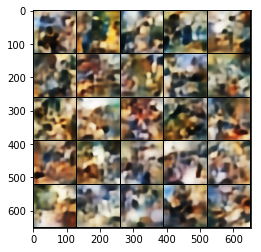

epoch=24,	 train kldiv loss=51599.813901764355,	 train decoder loss=213699.45776016745


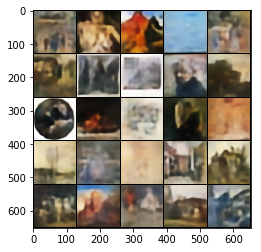

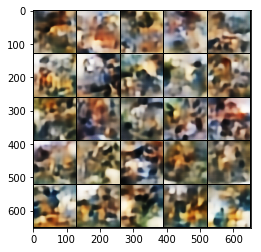

In [8]:
model = ConvolutionalVAE(channels=3, device=device)
model = model.to(device)
# model = nn.DataParallel(model).to(device)
optimizer = Adam(model.parameters())
valid_images = train_images[:25]
fit_model(model, optimizer, vae_mse_loss, train_loader, None, valid_images, 25, device)

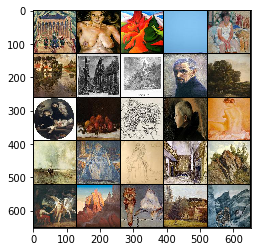

In [8]:
show_images(train_images[:25])

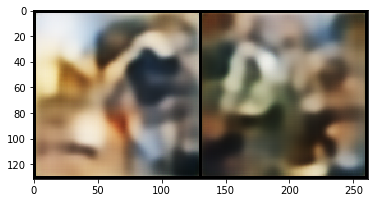

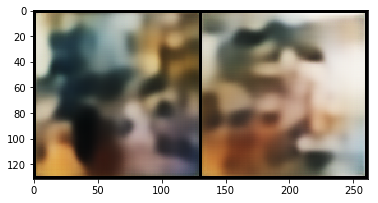

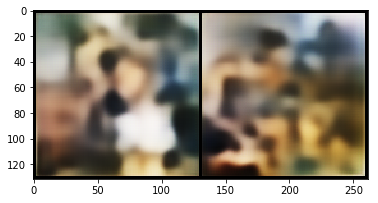

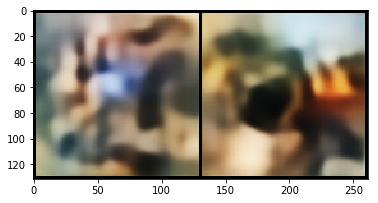

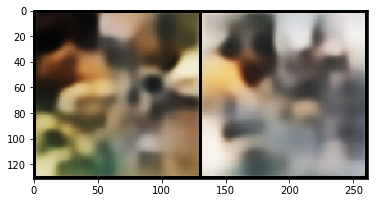

In [10]:
for _ in range(5):
    show_images(model.generate(2).cpu().detach())

In [12]:
torch.save({'state_dict': model.cpu().state_dict()}, str(Path('models', 'cvae.pt')))